# Computer Vision 2025 Assignment 1: Image filtering.

In this assignment, you will research, implement and test some image filtering operations. Image filtering by convolution is a fundamental step in many computer vision tasks and you will find it useful to have a firm grasp of how it works. For example, later in the course we will come across Convolutional Neural Networks (CNNs) which are built from convolutional image filters.

The main aims of the assignment are:

- to understand the basics of how images are stored and processed in memory;
- to gain exposure to several common image filters, and understand how they work;
- to get practical experience implementing convolutional image filters;
- to test your intuition about image filtering by running some experiments;
- to report your results in a clear and concise manner.

*This assignment relates to the following ACS CBOK areas: abstraction, design, hardware and software, data and information, HCI and programming.*

## General instructions

Follow the instructions in this Python notebook and the accompanying file *a1code.py* to answer each question. It's your responsibility to make sure your answer to each question is clearly labelled and easy to understand. Note that most questions require some combination of Python code, graphical output, and text analysing or describing your results. Although we will check your code as needed, marks will be assigned based on the quality of your write up rather than for code correctness! This is not a programming test - we are more interested in your understanding of the topic.

Only a small amount of code is required to answer each question. We will make extensive use of the Python libraries

- [numpy](numpy.org) for mathematical functions
- [skimage](https://scikit-image.org) for image loading and processing
- [matplotlib](https://matplotlib.org/stable/index.html) for displaying graphical results
- [jupyter](https://jupyter.org) for Jupyter Notebooks

You should get familiar with the documentation for these libraries so that you can use them effectively.

# The Questions

To get started, below is some setup code to import the libraries we need. You should not need to edit it.

In [3]:
# Numpy is the main package for scientific computing with Python.
import numpy as np

#from skimage import io

# Imports all the methods we define in the file a1code.py
from a1code import *

# Matplotlib is a useful plotting library for python
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Question 0: Numpy warm up! (Not Assesed. This part is for you to understand the basic of numpy)

Before starting the assignment, make sure you have a working Python 3 installation, with up to date versions of the libraries mentioned above. If this is all new to you, I'd suggest  downloading an all in one Python installation such as [Anaconda](https://www.anaconda.com/products/individual). Alternatively you can use a Python package manager such as pip or conda, to get the libraries you need. If you're struggling with this please ask a question on the MyUni discussion forum.

For this assignment, you need some familiarity with numpy syntax. The numpy QuickStart should be enough to get you started:

https://numpy.org/doc/stable/user/quickstart.html

Here are a few warm up exercises to make sure you understand the basics. Answer them in the space below. Be sure to print the output of each question so we can see it!

1. Create a 1D numpy array Z with 12 elements. Fill with values 1 to 12.
2. Reshape Z into a 2D numpy array A with 3 rows and 4 columns.
3. Reshape Z into a 2D numpy array B with 4 rows and 3 columns.
4. Calculate the *matrix* product of A and B.
5. Calculate the *element wise* product of $A$ and $B^T$ (B transpose).


**create 1D numpy array**

In [4]:
import numpy as np 
#1
Z = np.arange(1,13)
print(f'1D array:{Z}')
#2- reshaping

A= Z.reshape(3,4)#4 arrays(columns), 3 rows(elements)
print(f'2D array of 3 rows, 4 columns is:{A}')
#3
B=Z.reshape(4,3)
print(f'2D array of 4 rows,3 columns is:{B}')
#4- matrix
matrix = np.matmul(A,B)
print(f'Matrix product of A and B is :\n{matrix}')
#5-transpose
B_T = np.transpose(B)
print(f'Transpose of B is:{B_T}')

#5-Element wise
element = A * B_T
print(f'element wise of product A and B^T is:{element}')

1D array:[ 1  2  3  4  5  6  7  8  9 10 11 12]
2D array of 3 rows, 4 columns is:[[ 1  2  3  4]
 [ 5  6  7  8]
 [ 9 10 11 12]]
2D array of 4 rows,3 columns is:[[ 1  2  3]
 [ 4  5  6]
 [ 7  8  9]
 [10 11 12]]
Matrix product of A and B is :
[[ 70  80  90]
 [158 184 210]
 [246 288 330]]
Transpose of B is:[[ 1  4  7 10]
 [ 2  5  8 11]
 [ 3  6  9 12]]
element wise of product A and B^T is:[[  1   8  21  40]
 [ 10  30  56  88]
 [ 27  60  99 144]]


You need to be comfortable with numpy arrays because that is how we store images. Let's do that next!

## Question 1: Loading and displaying an image (10%)

Below is a function to display an image using the pyplot module in matplotlib. Implement the `load()` and `print_stats()` functions in a1code.py so that the following code loads the mandrill image, displays it and prints its height, width and channel.

In [5]:
def display(img, caption=''):
    # Show image using pyplot
    plt.figure()
    plt.imshow(img)
    plt.title(caption)
    plt.axis('off')
    plt.show()

Return to this question after reading through the rest of the assignment. Find **at least 2 more images** to use as test cases in this assignment for all the following questions and display them below. Use your print_stats() function to display their height, width and number of channels. Explain *why* you have chosen each image.

In [6]:
### Your code to load and display your images here
import math 
from skimage import io

def load(img_path):
    """Loads an image from a file path.

    HINT: Look up `skimage.io.imread()` function.
    HINT: Converting all pixel values to a range between 0.0 and 1.0
    (i.e. divide by 255) will make your life easier later on!
    
    Inputs:
        image_path: file path to the image.

    Returns:
        out: numpy array of shape(image_height, image_width, 3).
    """
    out = None
    # YOUR CODE HERE
    out = io.imread(img_path)#load the image
    out = out.astype(np.float32)/255.0 #normalize the pixel values to [0,1] by dividing by 255
    return out


def print_stats(image):
    """ Prints the height, width and number of channels in an image.
        
    Inputs:
        image: numpy array of shape(image_height, image_width, n_channels).
        
    Returns: none
                
    """
    
    # YOUR CODE HERE
    height, width = image.shape[:2] #get height and with 
    channels = 1 if len(image.shape) == 2 else image.shape[2] #1 for grayscale, 3 for RGB
    print(f"Height:{height}, width:{width}, channels:{channels}")

    return None

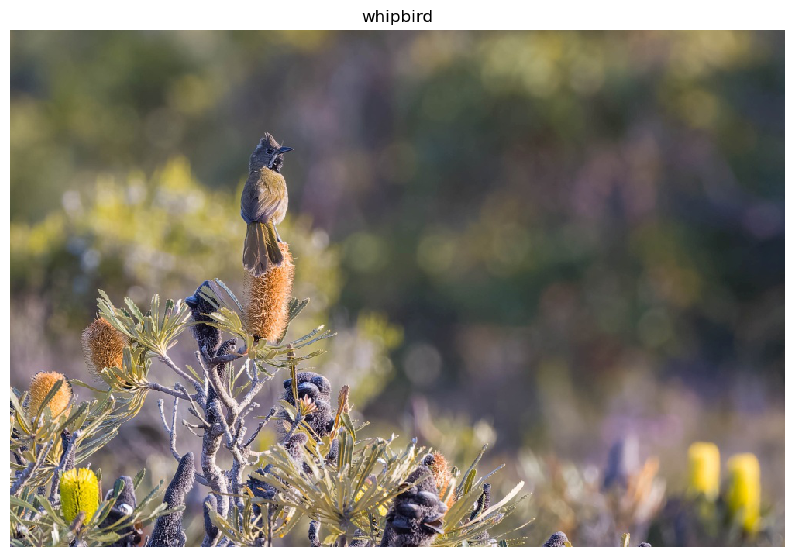

Height:667, width:1000, channels:3


In [7]:
image1 = load('images/whipbird.jpg')

display(image1, 'whipbird')

print_stats(image1)

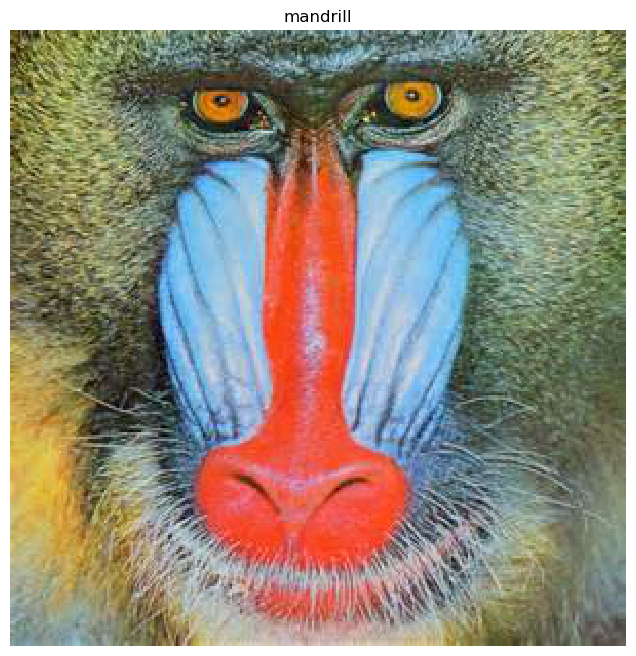

Height:300, width:300, channels:3


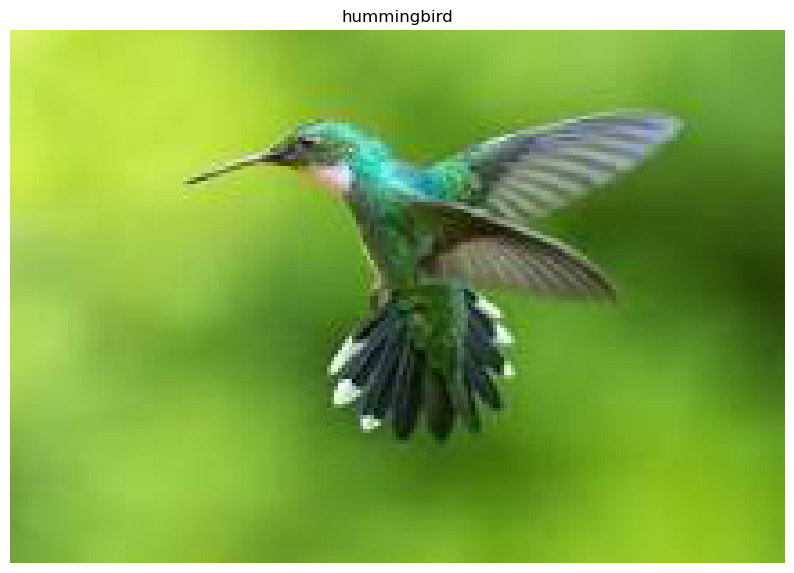

Height:148, width:215, channels:3


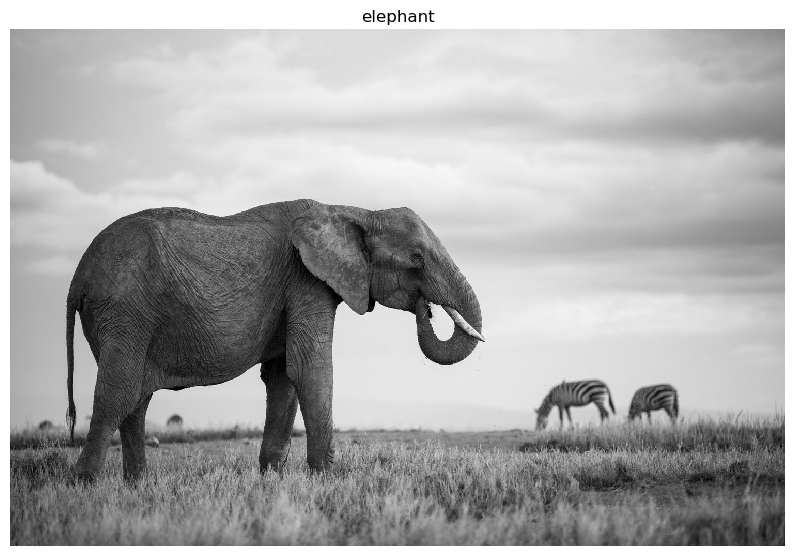

Height:1000, width:1500, channels:3


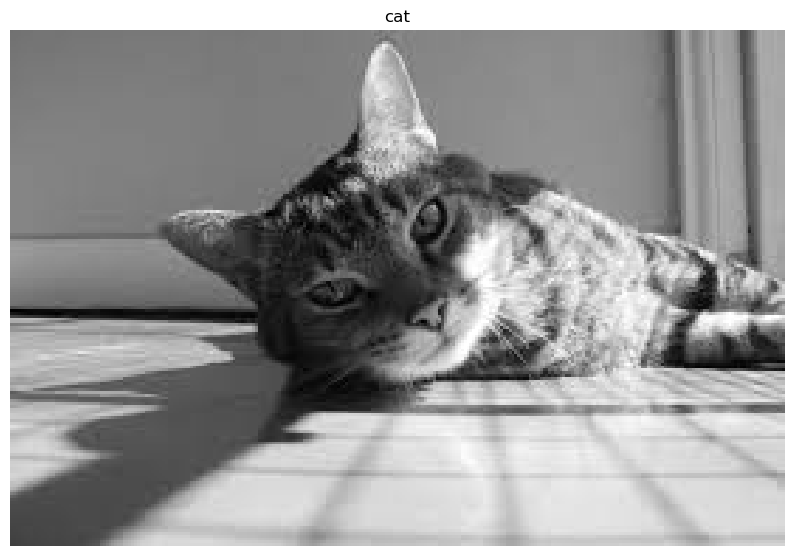

Height:183, width:275, channels:3


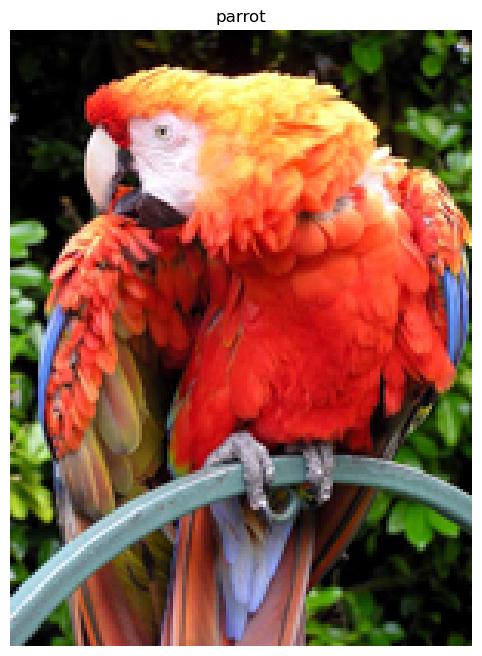

Height:200, width:150, channels:3


In [8]:
#load and print statistics for the images

#image 2
image2=load('images/mandrill.jpg')

display(image2,'mandrill')

print_stats(image2)

#image3
image3=load('images/hummingbird.jpg')

display(image3,'hummingbird')

print_stats(image3)

#image4
image4=load('images/elephant.jpg')

display(image4,'elephant')

print_stats(image4)

#image5
image5 = load('images/cat.jpg')

display(image5,'cat')

print_stats(image5)

#image6
image6 = load('images/parrot.jpg')

display(image6,'parrot')

print_stats(image6)

***Your explanation of images here***


mandrill image helps identify high contrast and vibrant colors. It contains a wide range of red,green,blue inentisites and so is ideal for testing transformations on individual color channels.

hummingbird includes bright subject against complex background and so is good for analyzing contrast and color adjustments.

elephant is mostly grayscale with subtle color varations and so can be used for testing grayscale processing and contrast enhancements.

cat image contains sharp edges and soft textures and so can be used for brightness scaling and threshold. the contrast between fur and background allows or clear visualization of intensity based transformations.

parrot image is an example of RGB image and enables pre-channel processing in RGB mode.TThis image helps us identify color distortions and balance shifts.


In [9]:

#adjust brightness 
def adjust_brightness(image, value=50):
    
    return cv2.add(image,np.array([value],dtype=np.uint8)) #increase or decrease brightness by adding a constant value"
    #increase brightness by adding value (50) to each pixel. 
    #cv2 ensures pixel value doesnt go beyong 255.

def contrast_stretching(image):
    #enhance contrast by normalizing pixel values.
    min_val = np.min(image)
    max_val = np.max(image)
    if max_val == min_val:
        return image #return original image if all pixels are the same 
    
    stretched = (image - min_val) * (255/(max_val - min_val))
    return stretched.astype(np.uint8)

def gamma_correction(image,gamma=2.0):
#apply gamma correction : output = (input / 255)^gamma * 255
    lookup_table = np.array([((i / 255.0) ** gamma) * 255 for i in np.arange(0,256)]).astype("uint8")
    return cv2.LUT(image,lookup_table)

def thresholding(image,threshold=128):
    # If the image is single channel (already grayscale), no need to convert
    if len(image.shape) == 2:  # Single-channel (grayscale) image
        gray = image
    else:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale if it's a multi-channel image
        
    _, binary = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)
    return binary  # No need to convert back to BGR, since it's single channel now

def logarithmic_transformation(image):
    #enhance dark regions using logarithmic scaling
    c=255/np.log(1 + np.max(image))
    log_transformed = c * np.log(1 + image.astype(np.float32))
    return np.uint8(log_transformed)

def power_law_transformation(image, gamma = 0.5):
    ##apply power law (gamma) transformation 
    lookup_table = np.array([((i / 255.0) ** gamma) * 255 for i in np.arange(0,256)]).astype("uint8")
    return cv2.LUT(image,lookup_table)



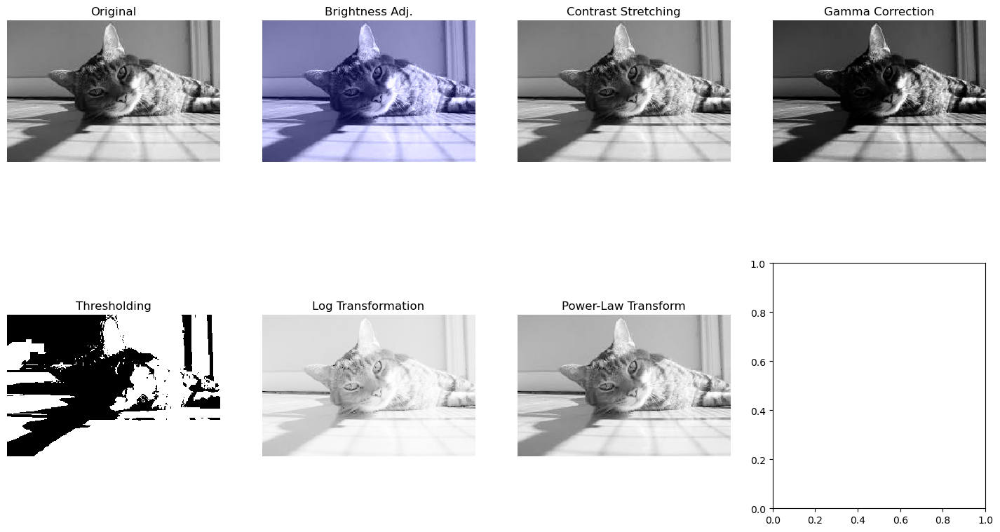

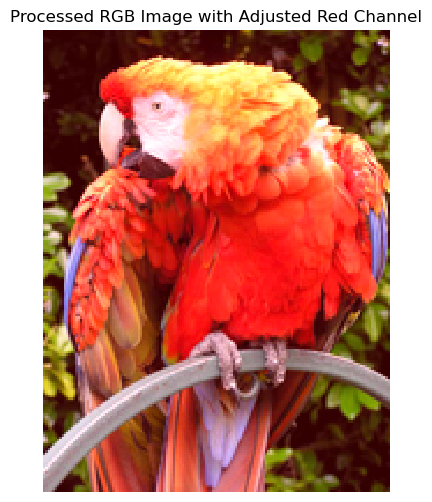

In [10]:
import os
import cv2

# Loop through all images and apply transformations
input_folder = r"C:\Users\Nethmi\2025\sem 1\computer vision\assignments\Assignment_1\images"

output_folder = r"C:\Users\Nethmi\2025\sem 1\computer vision\assignments\Assignment_1\processed images"  # Updated path

# Part 1: Apply point processing to the selected image
part_1_image = "cat.jpg"  # Name of the image for part 1
img_path_part_1 = os.path.join(input_folder, part_1_image)
image_part_1 = cv2.imread(img_path_part_1)

if image_part_1 is None:
    print(f"Could not read image: {part_1_image}")
else:
    # Apply transformations to the selected image
    bright_image_part_1 = adjust_brightness(image_part_1, value=50)
    contrast_image_part_1 = contrast_stretching(image_part_1)
    gamma_image_part_1 = gamma_correction(image_part_1, gamma=2.0)
    threshold_image_part_1 = thresholding(image_part_1, threshold=128)
    log_image_part_1 = logarithmic_transformation(image_part_1)
    power_image_part_1 = power_law_transformation(image_part_1, gamma=0.5)

    # Save processed images for Part 1
    cv2.imwrite(os.path.join(output_folder, f"bright_{part_1_image}"), bright_image_part_1)
    cv2.imwrite(os.path.join(output_folder, f"contrast_{part_1_image}"), contrast_image_part_1)
    cv2.imwrite(os.path.join(output_folder, f"gamma_{part_1_image}"), gamma_image_part_1)
    cv2.imwrite(os.path.join(output_folder, f"threshold_{part_1_image}"), threshold_image_part_1)
    cv2.imwrite(os.path.join(output_folder, f"log_{part_1_image}"), log_image_part_1)
    cv2.imwrite(os.path.join(output_folder, f"power_{part_1_image}"), power_image_part_1)

    # Display results for Part 1
    fig, axes = plt.subplots(2, 4, figsize=(18, 10))
    images = [image_part_1, bright_image_part_1, contrast_image_part_1, gamma_image_part_1, 
              threshold_image_part_1, log_image_part_1, power_image_part_1]
    titles = ["Original", "Brightness Adj.", "Contrast Stretching", "Gamma Correction", 
              "Thresholding", "Log Transformation", "Power-Law Transform"]

    for i, ax in enumerate(axes.flatten()):
        if i < len(images):
            ax.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
            ax.set_title(titles[i])
            ax.axis("off")

    plt.show()

# Part 2: Apply point processing to only one channel (e.g., Red) of an RGB image
part_2_image = "parrot.jpg"  # Name of the image for part 2
img_path_part_2 = os.path.join(input_folder, part_2_image)
image_part_2 = cv2.imread(img_path_part_2)

if image_part_2 is None:
    print(f"Could not read image: {part_2_image}")
else:
    # Extract the Red channel
    red_channel = image_part_2[:, :, 2]  # Red channel in OpenCV is at index 2 (BGR format)

    # Apply transformations to the Red channel only
    red_channel_bright = adjust_brightness(red_channel, value=50)
    red_channel_contrast = contrast_stretching(red_channel)
    red_channel_gamma = gamma_correction(red_channel, gamma=2.0)
    red_channel_threshold = thresholding(red_channel, threshold=128)
    red_channel_log = logarithmic_transformation(red_channel)
    red_channel_power = power_law_transformation(red_channel, gamma=0.5)

    # Replace the Red channel in the image with the processed Red channel
    image_part_2[:, :, 2] = red_channel_bright  # Replace Red channel with processed channel

    # Save processed images for Part 2 (can save different transformations applied to red channel)
    cv2.imwrite(os.path.join(output_folder, f"red_bright_{part_2_image}"), red_channel_bright)
    cv2.imwrite(os.path.join(output_folder, f"red_contrast_{part_2_image}"), red_channel_contrast)
    cv2.imwrite(os.path.join(output_folder, f"red_gamma_{part_2_image}"), red_channel_gamma)

    # Display results for Part 2
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(image_part_2, cv2.COLOR_BGR2RGB))
    plt.title("Processed RGB Image with Adjusted Red Channel")
    plt.axis("off")
    plt.show()

## Question 2: Image processing (30%)

Now that you have an image stored as a numpy array, let's try some operations on it.

1. Implement the `crop()` function in a1code.py. Use array slicing to crop the image.
2. Implement the `resize()` function in a1code.py.
3. Implement the `change_contrast()` function in a1code.py.
4. Implement the `greyscale()` function in a1code.py.
5. Implement the `binary()` function in a1code.py.

What do you observe when you change the threshold of the binary function?

Apply all these functions with different parameters on your own test images.

In [11]:
import numpy as np
import cv2

def crop(image, start_row, start_col, num_rows, num_cols):
    """Crop an image based on the specified bounds. Use array slicing.

    Inputs:
        image: numpy array of shape(image_height, image_width, 3).
        start_row (int): The starting row index 
        start_col (int): The starting column index 
        num_rows (int): Number of rows in our cropped image.
        num_cols (int): Number of columns in our cropped image.

    Returns:
        out: numpy array of shape(num_rows, num_cols, 3).
    """
    return image[start_row:start_row+num_rows, start_col:start_col+num_cols]

def resize(input_image, output_rows, output_cols):
    """Resize an image using the nearest neighbor method.
    i.e. for each output pixel, use the value of the nearest input pixel after scaling

    Inputs:
        input_image: RGB image stored as an array, with shape
            `(input_rows, input_cols, 3)`.
        output_rows (int): Number of rows in our desired output image.
        output_cols (int): Number of columns in our desired output image.

    Returns:
        np.ndarray: Resized image, with shape `(output_rows, output_cols, 3)`.
    """
    out = cv2.resize(input_image, (output_cols, output_rows), interpolation=cv2.INTER_NEAREST)
    return out

def change_contrast(image, factor):
    """Change the value of every pixel by following

                        x_n = factor * (x_p - 0.5) + 0.5

    where x_n is the new value and x_p is the original value.
    Assumes pixel values between 0.0 and 1.0 
    If you are using values 0-255, change 0.5 to 128.

    Inputs:
        image: numpy array of shape(image_height, image_width, 3).
        factor (float): contrast adjustment

    Returns:
        out: numpy array of shape(image_height, image_width, 3).
    """
    if image.dtype != np.float32:
        image = image.astype(np.float32) / 255.0

    out = factor * (image - 0.5) + 0.5
    out = np.clip(out, 0.0, 1.0)
    out = (out * 255).astype(np.uint8)
    return out

def greyscale(input_image):
    """Convert a RGB image to greyscale. 
    A simple method is to take the average of R, G, B at each pixel.
    Or you can look up more sophisticated methods online.
    
    Inputs:
        input_image: RGB image stored as an array, with shape
            `(input_rows, input_cols, 3)`.

    Returns:
        np.ndarray: Greyscale image, with shape `(output_rows, output_cols)`.
    """
    out = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)
    return out

def binary(grey_img, threshold):
    """Convert a greyscale image to a binary mask with threshold.

                    x_out = 0, if x_in < threshold
                    x_out = 1, if x_in >= threshold

    Inputs:
        input_image: Greyscale image stored as an array, with shape
            `(image_height, image_width)`.
        threshold (float): The threshold used for binarization, and the value range of threshold is from 0 to 1
    Returns:
        np.ndarray: Binary mask, with shape `(image_height, image_width)`.
    """
    threshold_value = int(threshold * 255)  # Convert to integer
    
    # Ensure the grayscale image is in uint8 format (0-255)
    if grey_img.dtype != np.uint8:
        grey_img = (grey_img * 255).astype(np.uint8)
    
    # Use OpenCV's threshold function to apply binary conversion
    _, out = cv2.threshold(grey_img, threshold_value, 255, cv2.THRESH_BINARY)
    
    return out


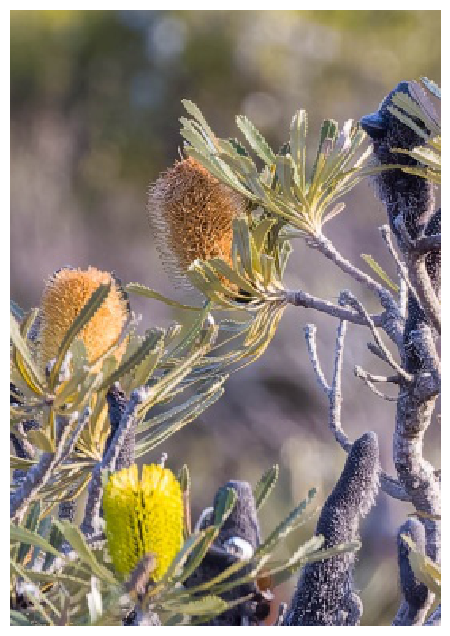

Height:389, width:272, channels:3


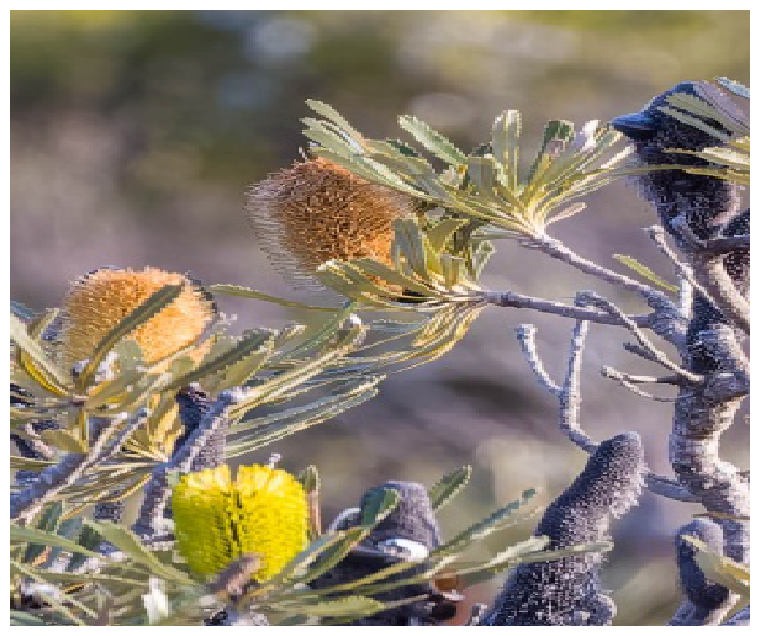

Height:500, width:600, channels:3


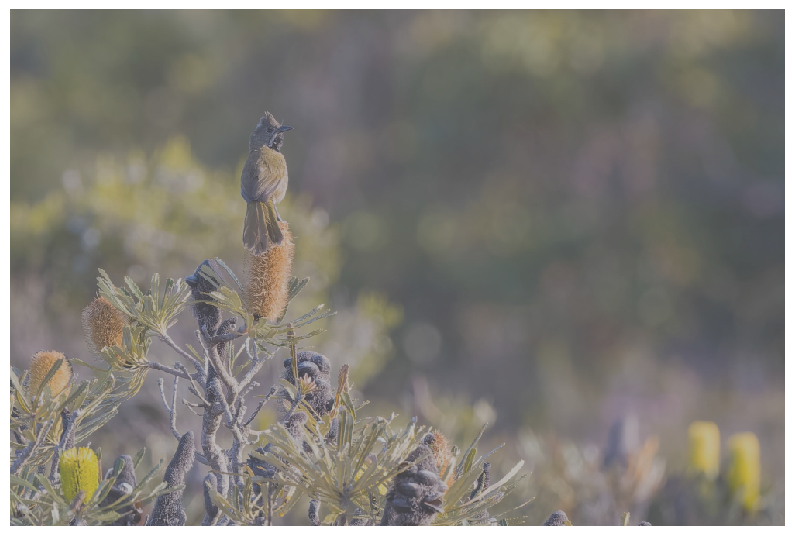

Height:667, width:1000, channels:3


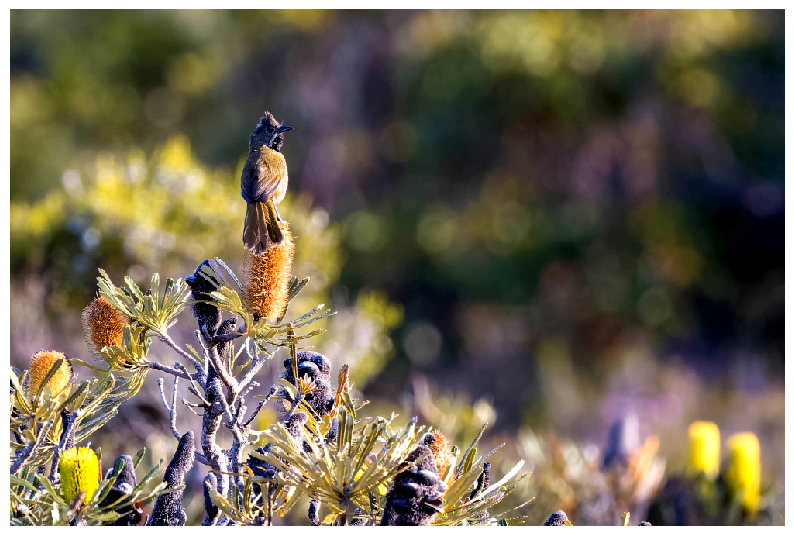

Height:667, width:1000, channels:3


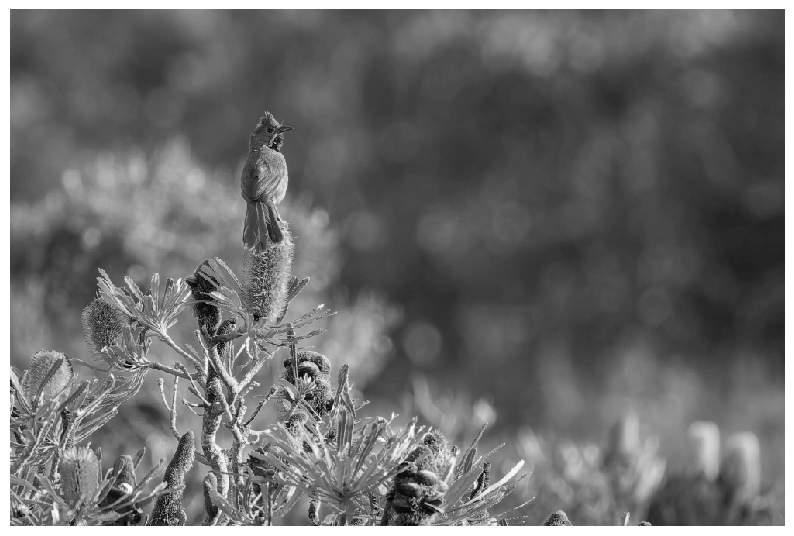

Height:667, width:1000, channels:1


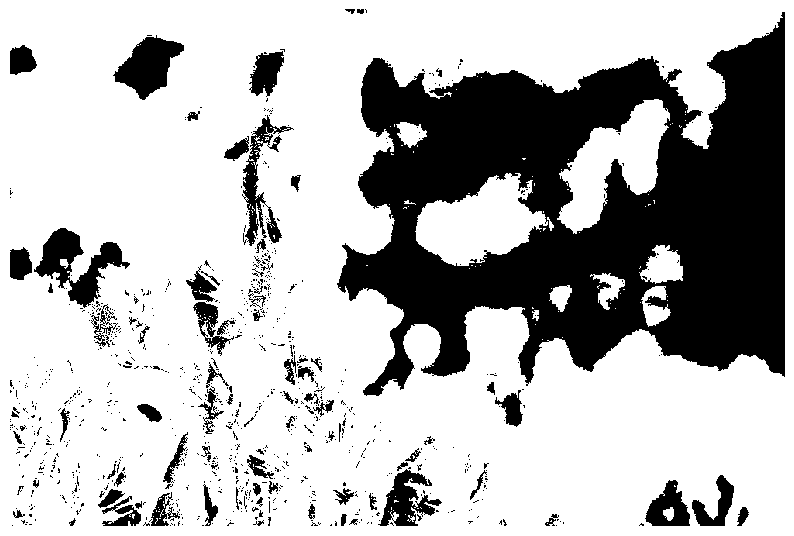

Height:667, width:1000, channels:1


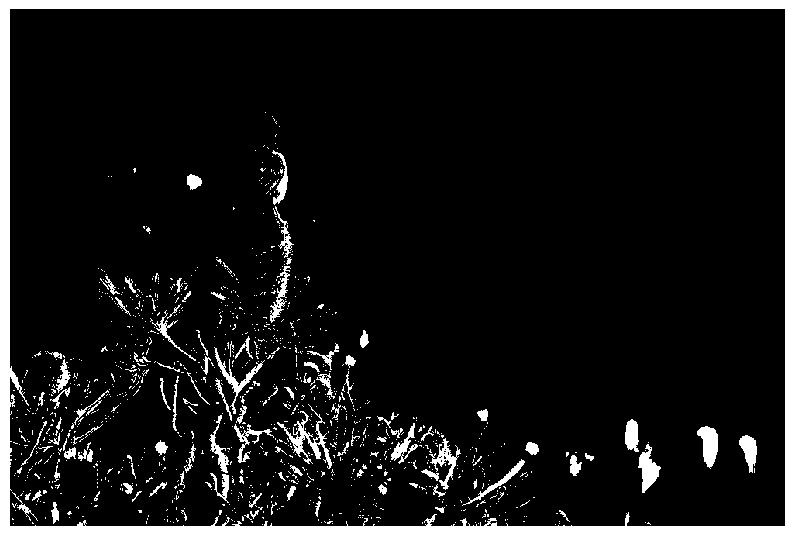

Height:667, width:1000, channels:1


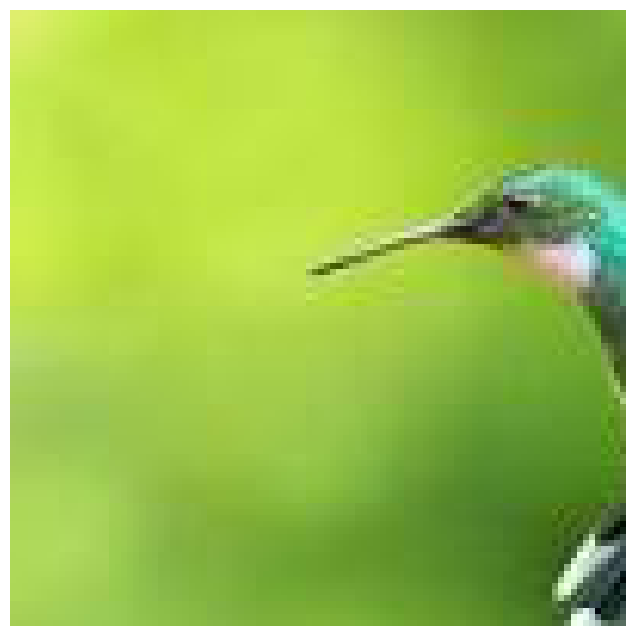

Height:100, width:100, channels:3


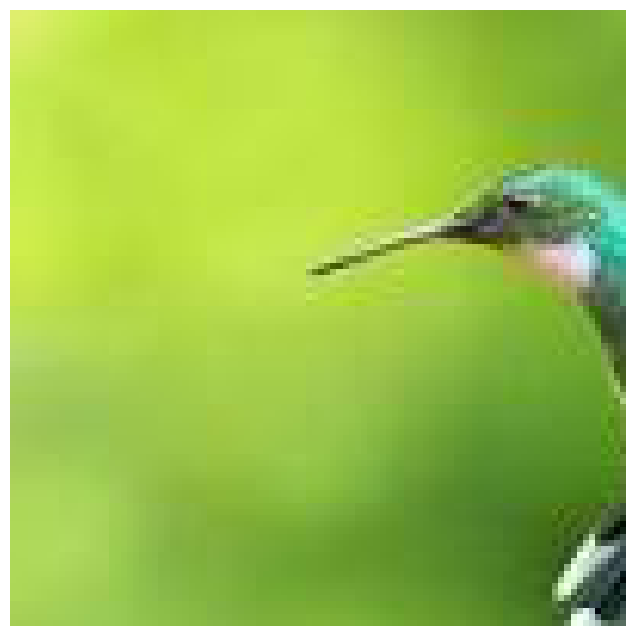

Height:300, width:300, channels:3
Description:
- The image has been cropped to a top-left 100x100 section.
- The cropped image is then resized to 300x300 pixels.
- The resized image will appear blurry due to the resizing of a small image using the nearest neighbor method.
TEST CASE 2 - RESIZE IMAGE USING SCALING FACTOR 


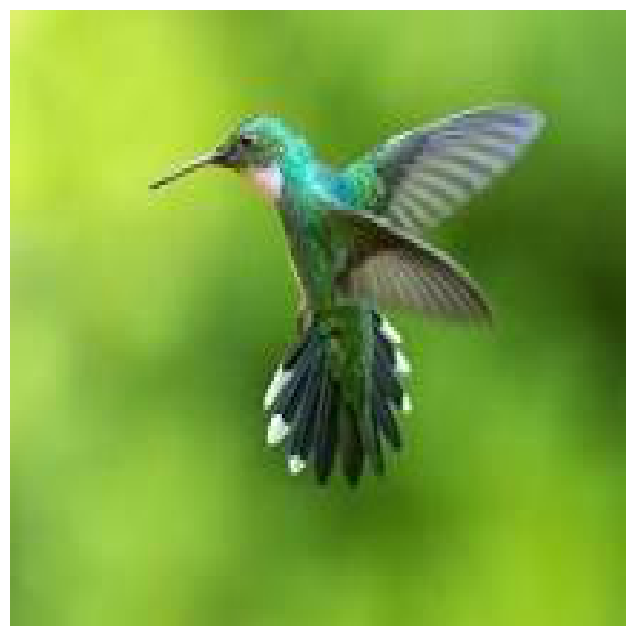

Height:1000, width:1000, channels:3
Description:
- The image is resized to 1000x1000 pixels.
- The image should appear larger but will show pixelation.
- This is because the resizing was done using the nearest neighbor method, which adds new pixels by duplicating the nearest pixels, leading to a blocky or blurry appearance.
TEST CASE 3 - CONTRAST ADJUSTMENT FACTOR 0.5


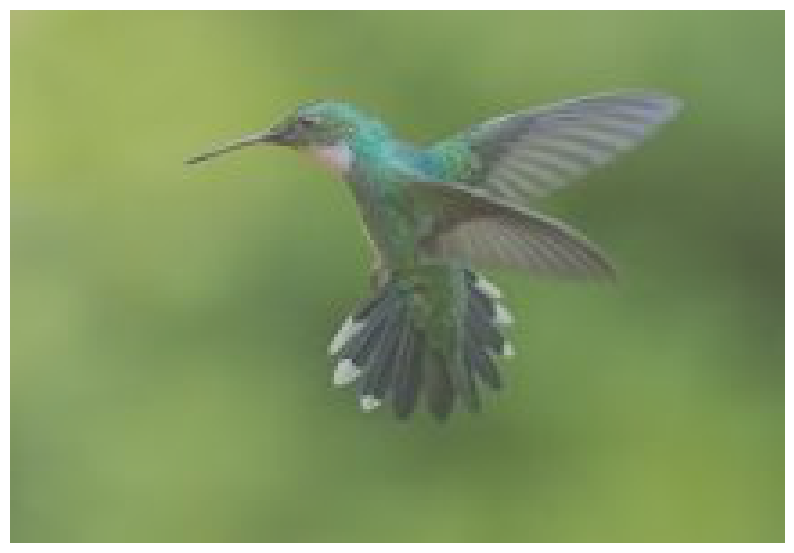

Height:148, width:215, channels:3
Description:
- The image's contrast has been reduced with a factor of 0.5.
- The image will appear more washed out, with reduced visibility and blurred details due to the lowered contrast.


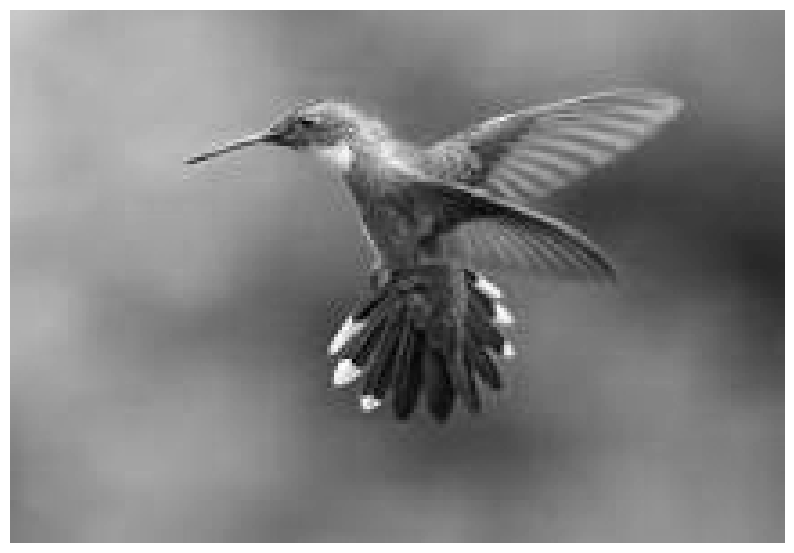

Height:148, width:215, channels:1
Description:
- The color image has been converted into a grayscale image.
- The grayscale value of each pixel is calculated by averaging the RGB values to produce a single intensity value.


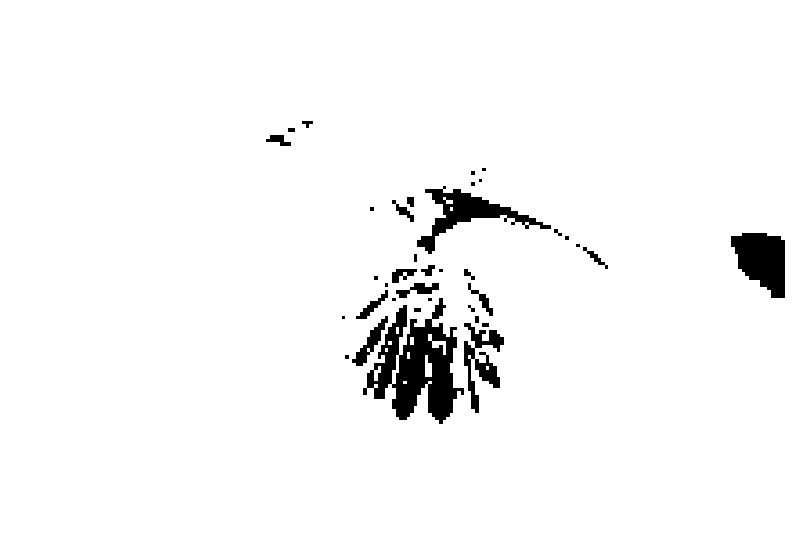

Height:148, width:215, channels:1
Description:
- The grayscale image has been binarized using a threshold of 0.2.
- Pixels with a value less than 0.2 are set to 0 (black), and those greater than or equal to 0.2 are set to 1 (white).


In [12]:
# This should crop the bird from the  image; you will need to adjust the parameters for the correct crop size and location
crop_img = crop(image1, 278, 5, 508, 272)
display(crop_img)
print_stats(crop_img)

resize_img = resize(crop_img, 500, 600)
display(resize_img)
print_stats(resize_img)

contrast_img = change_contrast(image1, 0.5)
display(contrast_img)
print_stats(contrast_img)

contrast_img = change_contrast(image1, 1.5)
display(contrast_img)
print_stats(contrast_img)

grey_img = greyscale(image1)
display(grey_img)
print_stats(grey_img)

binary_img = binary(grey_img, 0.3)
display(binary_img)
print_stats(binary_img)

binary_img = binary(grey_img, 0.7)
display(binary_img)
print_stats(binary_img)

# Add your own tests here...


#TEST CASE 1 - CROP FUNCTION
# Crop a small portion of the image (e.g., top-left corner)
crop_img = crop(image3, 0, 0, 100, 100)  # Top-left 100x100 section of the image
display(crop_img)
print_stats(crop_img)

# Resize the cropped image to 300x300 pixels (larger than the crop)
resize_img = resize(crop_img, 300, 300)
display(resize_img)
print_stats(resize_img)
print("Description:")
print(f"- The image has been cropped to a top-left 100x100 section.")
print(f"- The cropped image is then resized to 300x300 pixels.")
print(f"- The resized image will appear blurry due to the resizing of a small image using the nearest neighbor method.") 

#TEST CASE 2 - RESIZE FUNCTION 
print("TEST CASE 2 - RESIZE IMAGE USING SCALING FACTOR ")
# Test case: Resize the image by a scaling factor of 2 (double the size)
resized_img_scaling_up = resize(image3, 500 * 2, 500 * 2)  # Resize the image to 1000x1000
display(resized_img_scaling_up)
print_stats(resized_img_scaling_up)
print("Description:")
print(f"- The image is resized to 1000x1000 pixels.")
print(f"- The image should appear larger but will show pixelation.")
print(f"- This is because the resizing was done using the nearest neighbor method, which adds new pixels by duplicating the nearest pixels, leading to a blocky or blurry appearance.")

#TEST CASE 3 - CONTRAST FUNCTION  
print("TEST CASE 3 - CONTRAST ADJUSTMENT FACTOR 0.5")
contrast_img_low = change_contrast(image3,0.5)
display(contrast_img_low)
print_stats(contrast_img_low)

print("Description:")
print(f"- The image's contrast has been reduced with a factor of 0.5.")
print(f"- The image will appear more washed out, with reduced visibility and blurred details due to the lowered contrast.")


#TEST CASE 4 - GREYSCALE FUNCTION 
# Call the greyscale function
greyscale_img_simple = greyscale(image3)

# Display the result
display(greyscale_img_simple)
print_stats(greyscale_img_simple)
print("Description:")
print(f"- The color image has been converted into a grayscale image.")
print(f"- The grayscale value of each pixel is calculated by averaging the RGB values to produce a single intensity value.")
      
#TEST CASE 5 - BINARY FUNCTION 
grey_img = greyscale(image3)

# Define a threshold for the binary function
threshold = 0.2

# Call the binary function to binarize the grayscale image with the given threshold
binary_img = binary(grey_img, threshold)

# Display the result
display(binary_img)
print_stats(binary_img)

# Explanation of the output
print("Description:")
print(f"- The grayscale image has been binarized using a threshold of {threshold}.")
print(f"- Pixels with a value less than {threshold} are set to 0 (black), and those greater than or equal to {threshold} are set to 1 (white).")

## Question 3: Convolution (30%)

### 3.1(a) 2D convolution

Using the definition of 2D convolution from week 1, implement the convolution operation in the function `conv2D()` in a1code.py.


In [13]:

def conv2D(image, kernel):
    
    """ Convolution of a 2D image with a 2D kernel. 
    Convolution is applied to each pixel in the image.
    Assume values outside image bounds are 0.
    
    Args:
        image: numpy array of shape (Hi, Wi).
        kernel: numpy array of shape (Hk, Wk). Dimensions will be odd.

    Returns:
        out: numpy array of shape (Hi, Wi)
    """
    Hi, Wi = image.shape  # Image height and width
    Hk, Wk = kernel.shape  # Kernel height and width
    
    # Compute padding (assuming odd kernel dimensions)
    pad_height = Hk // 2
    pad_width = Wk // 2
    
    # Flip the kernel for convolution
    kernel_flipped = np.flip(np.flip(kernel, axis=0), axis=1)

    # Pad the input image with zeros
    padded_img = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant', constant_values=0)

    # Initialize the output image
    out = np.zeros_like(image)

    # Perform 2D convolution
    for i in range(Hi):
        for j in range(Wi):
            region = padded_img[i:i+Hk, j:j+Wk]  # Extract the region of interest
            out[i, j] = np.sum(region * kernel_flipped)  # element wise multiplication and sum the result

    return out


In [14]:

def test_conv2D():
    """ A simple test for your 2D convolution function.
        You can modify it as you like to debug your function.
    
    Returns:
        None
    """

    # Test code written by 
    # Simple convolution kernel.
    kernel = np.array(
    [
        [1,0,1],
        [0,0,0],
        [1,0,0]
    ])

    # Create a test image: a white square in the middle
    test_img = np.zeros((9, 9))
    test_img[3:6, 3:6] = 1

    # Run your conv_nested function on the test image
    test_output = conv2D(test_img, kernel)

    # Build the expected output
    expected_output = np.zeros((9, 9))
    expected_output[2:7, 2:7] = 1
    expected_output[5:, 5:] = 0
    expected_output[4, 2:5] = 2
    expected_output[2:5, 4] = 2
    expected_output[4, 4] = 3
    
    # Visualize input, output, and expected output
    plt.figure(figsize=(10,3))
    plt.subplot(1, 3, 1)
    plt.imshow(test_img, cmap='gray')  # Plot the input image here
    plt.title("Input image")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(test_output, cmap='gray')  # Plot the convolution output here
    plt.title("Convolution Output")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(expected_output, cmap='gray')  # Plot the expected output here
    plt.title("Expected Output")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

    # Check if the output matches expected output
    print(np.max(test_output - expected_output))  # Debugging line
    # Test if the output matches expected output
    assert np.max(test_output - expected_output) < 1e-10, "Your solution is not correct."


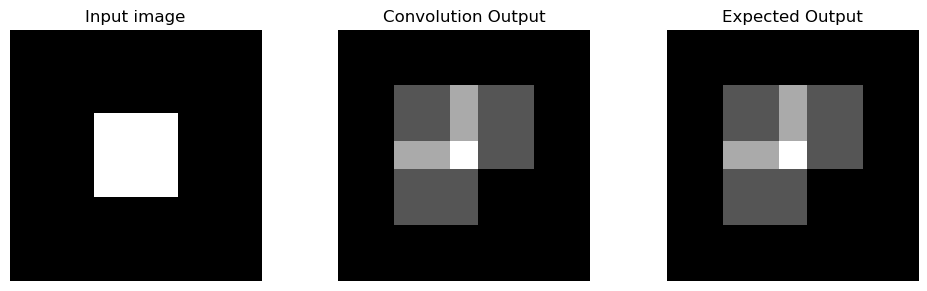

0.0


In [15]:
test_conv2D()

### 3.1(b) RGB convolution

In the function `conv` in a1code.py, extend your function `conv2D` to work on RGB images, by applying the 2D convolution to each channel independently.

In [16]:
def conv(image, kernel):
    """Convolution of a RGB or grayscale image with a 2D kernel
    
    Args:
        image: numpy array of shape (Hi, Wi, 3) or (Hi, Wi)
        kernel: numpy array of shape (Hk, Wk). Dimensions will be odd.

    Returns:
        out: numpy array of shape (Hi, Wi, 3) or (Hi, Wi)
    """
    out = None
    ### YOUR CODE HERE
    if image.ndim ==2:
        return conv2D(image,kernel)
    elif image.ndim ==3 and image.shape[2] == 3:
        out=np.zeros_like(image)
        for c in range(3):
            out[:,:,c] = conv2D(image[:,:,c], kernel)
        return out
    
    else:
        raise ValueError("unsupported image shape.Must be (H,W) or(H,W,3).")


### 3.2 Gaussian filter convolution

Use the `gauss2D` function provided in a1code.py to create a Gaussian kernel, and apply it to your images with convolution. You will obtain marks for trying different tests and analysing the results, for example:

- try varying the image size, and the size and variance of the filter  
- subtract the filtered image from the original - this gives you an idea of what information is lost when filtering

What do you observe and why?

In [17]:

def gauss2D(size, sigma):

    """Function to mimic the 'fspecial' gaussian MATLAB function.
       You should not need to edit it.
       
    Args:
        size: filter height and width
        sigma: std deviation of Gaussian
        
    Returns:
        numpy array of shape (size, size) representing Gaussian filter
    """

    x, y = np.mgrid[-size//2 + 1:size//2 + 1, -size//2 + 1:size//2 + 1]
    g = np.exp(-((x**2 + y**2)/(2.0*sigma**2)))
    return g/g.sum()

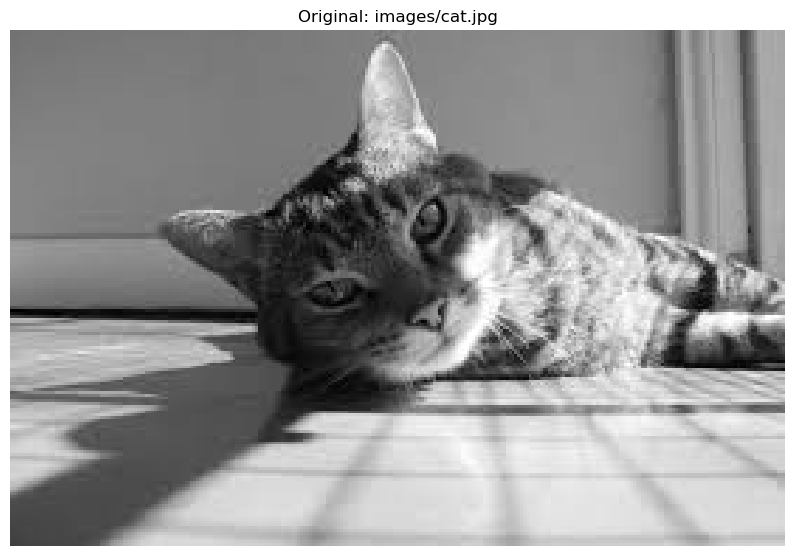

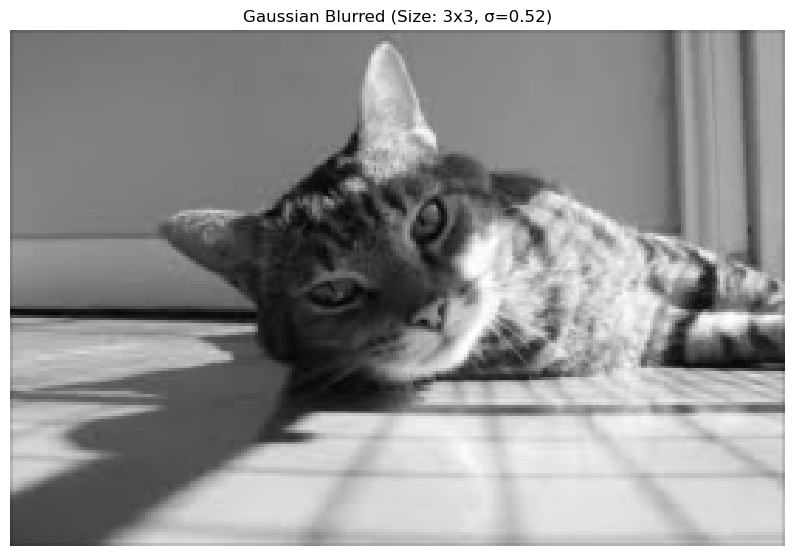

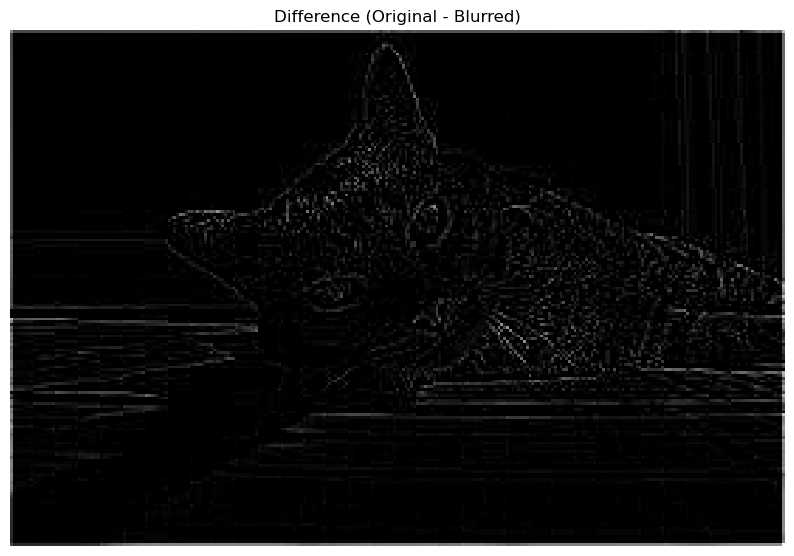

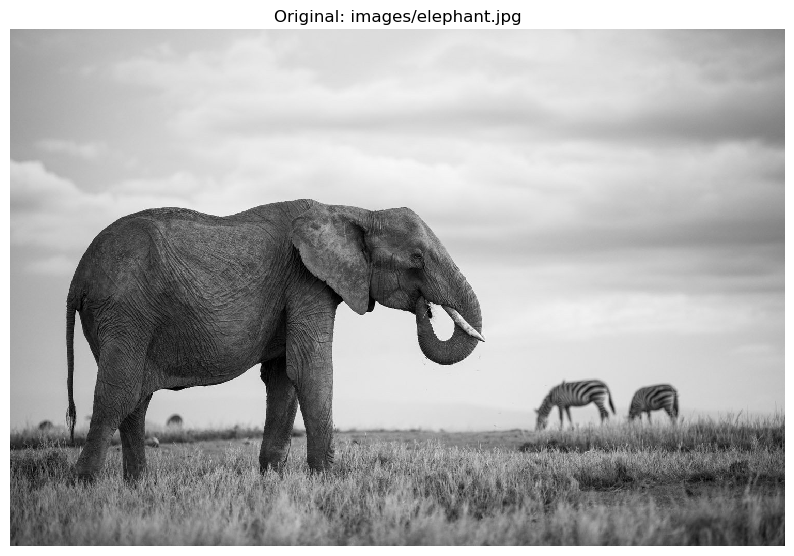

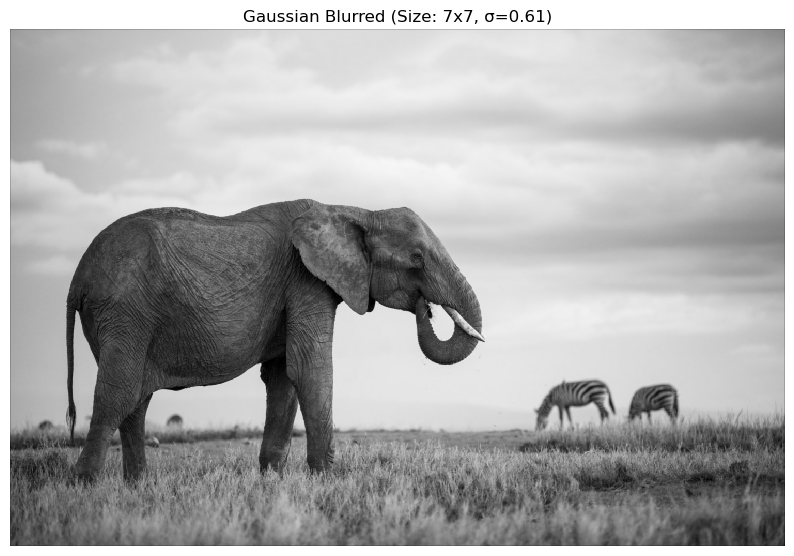

...

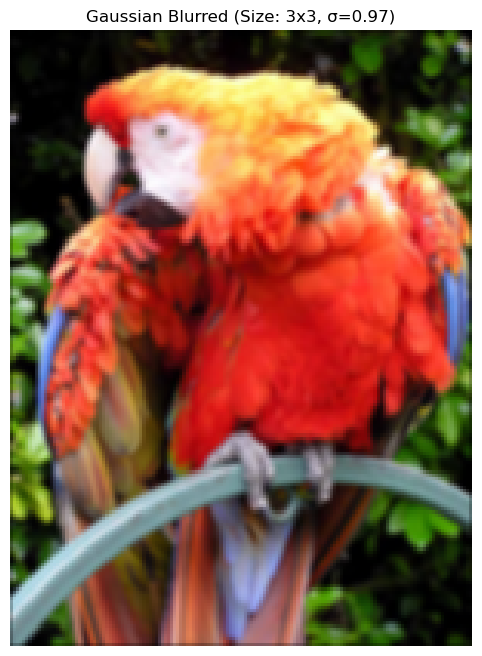

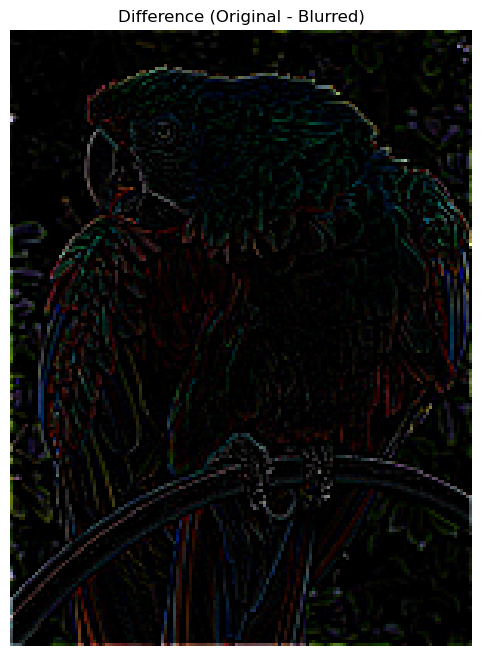

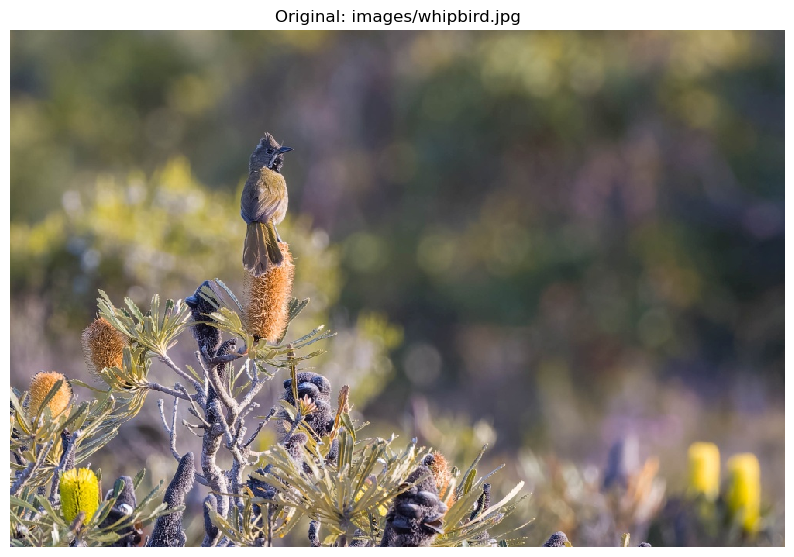

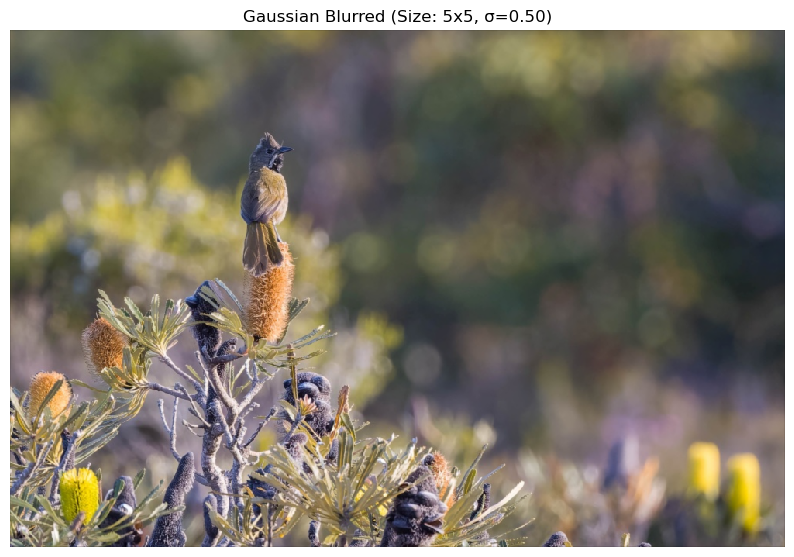

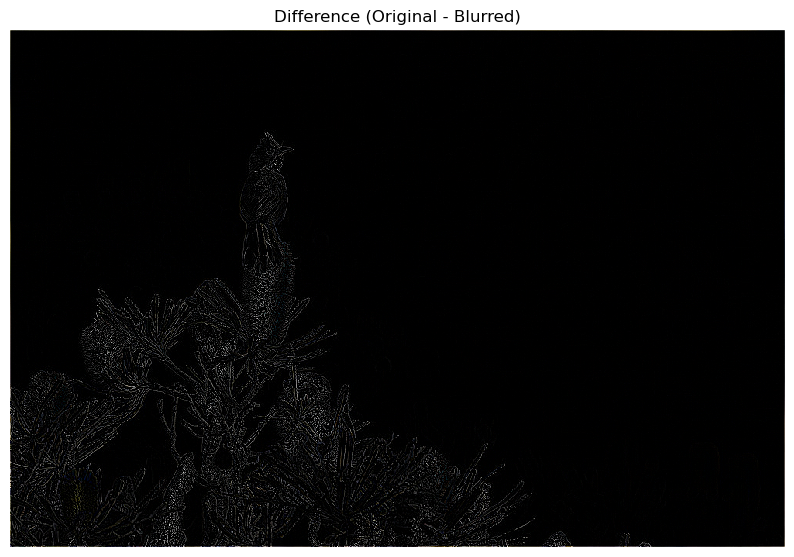

In [18]:
import cv2
#load the images
image_files = [
    "images/cat.jpg",
    "images/elephant.jpg",
    "images/hummingbird.jpg",
    "images/mandrill.jpg",
    "images/parrot.jpg",
    "images/whipbird.jpg",
]


def dynamic_gaussian_parameters(image):
    Hi, Wi = image.shape[:2]
    image_variance = np.var(image)  # Measure image texture variation
    
    # Adjust filter size based on resolution
    if Hi * Wi < 250000:  # Small image
        kernel_size = 3
    elif Hi * Wi < 1000000:  # Medium image
        kernel_size = 5
    else:  # Large image
        kernel_size = 7

    # Adjust sigma based on variance
    sigma = max(0.5, min(3, image_variance * 10))

    return kernel_size, sigma

def show_image(img, title):
    """Displays an image with a title."""
    if img.ndim == 2:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(np.clip(img, 0, 1))
    plt.title(title)
    plt.axis("off")
    plt.show()

# Process each image with dynamic Gaussian filtering
for img_path in image_files:
    image = cv2.imread(img_path)
    if image is None:
        print(f"Could not read image: {img_path}")
        continue
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    # Compute adaptive filter size & sigma
    kernel_size, sigma = dynamic_gaussian_parameters(image)
    
    # Create Gaussian kernel
    gaussian_kernel = gauss2D(kernel_size, sigma)
    
    # Apply Gaussian filter
    blurred = conv(image, gaussian_kernel)

    # Compute difference image
    diff = np.clip(image - blurred, 0,1)
    
    # Normalize the difference image for better visualization
    diff_normalized = (diff - np.min(diff)) / (np.max(diff) - np.min(diff))  # Normalize to [0, 1]

    # Show results
    show_image(image, f"Original: {img_path}")
    show_image(blurred, f"Gaussian Blurred (Size: {kernel_size}x{kernel_size}, σ={sigma:.2f})")
    show_image(diff_normalized, "Difference (Original - Blurred)")
    

- theres blurring effects increases as the kernel sizes grows larger and as sigma increases.

- fine details such as fur on the cat, feathers on the parrot, wrinkles on the elephant are smoothed out, while the edges become softer and less defined. 

- the gaussian filter acts as a low pass filter ,preserving smooth areas and removing high frequency components like edges and textures . It can be used to reduce image sharpness. 

- the gaussian filtering strength depends on the kernel size and sigma . the kernel size determines the spatial extent of the filter ( how many surrounding pixels are considered) while sigma controls how much influence distant pixels have on the center pixel (weight distribution in gaussian function). 

### 3.3 Sobel filters

Define a horizontal and vertical Sobel edge filter kernel and test them on your images. You will obtain marks for testing them and displaying results in interesting ways, for example:

- apply them to an image at different scales
- considering how to display positive and negative gradients
- apply different combinations of horizontal and vertical filters as asked in the Assignment sheet.

In [19]:
#horizontal sobel filter  (x-direction) --> detects the vertical edges
sobel_x = np.array([[1,0,-1],[2,0,-2],[1,0,-1]])

#vertical sobel filter (y-direction) --> detects the horizontal edges
sobel_y = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])


--- Scale: 1.0 ---


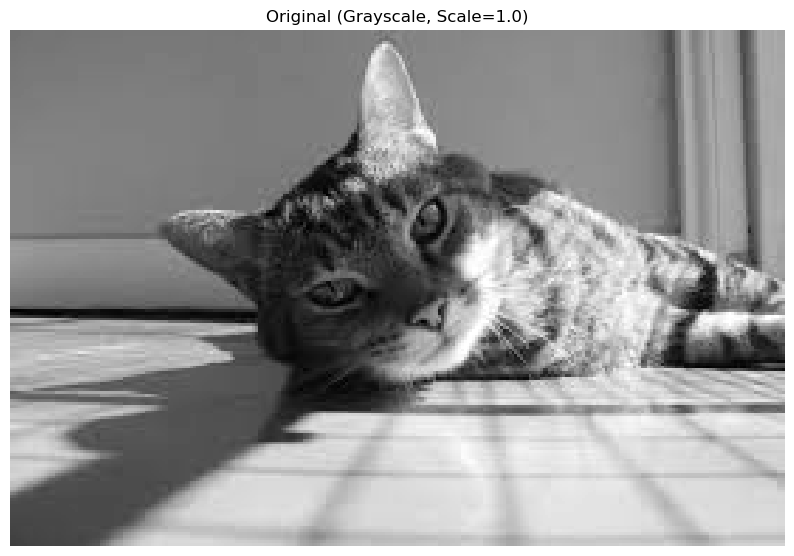

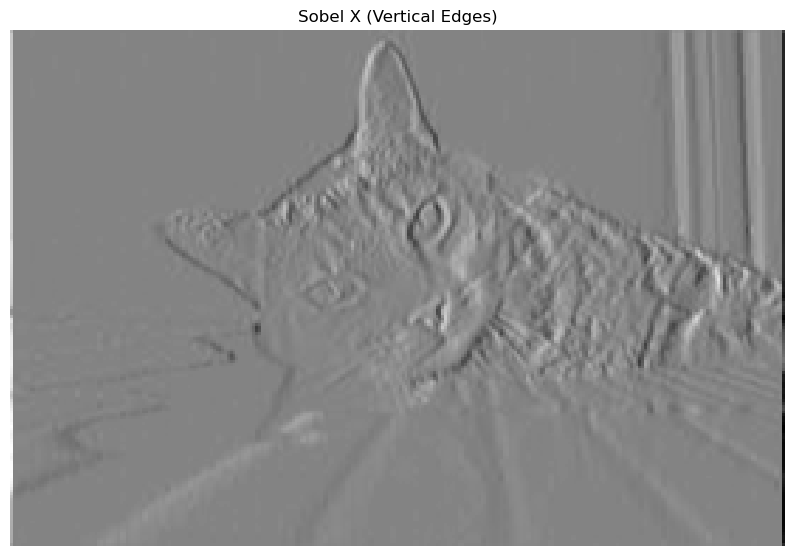

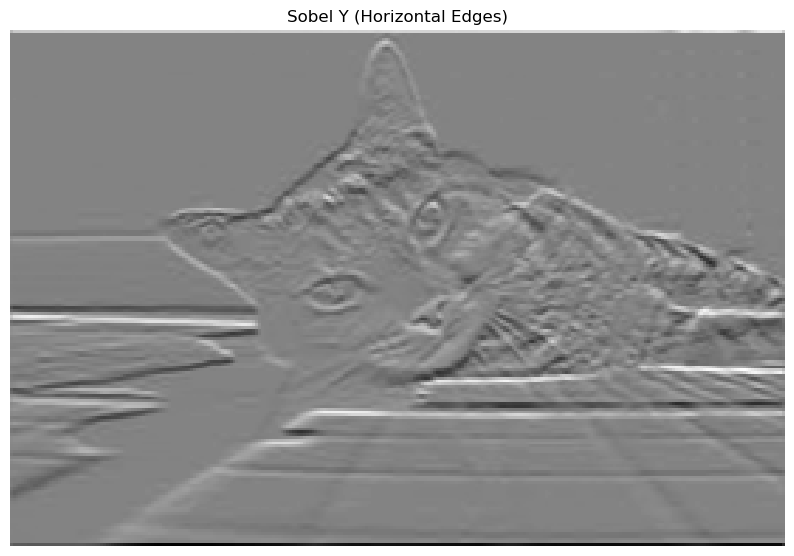

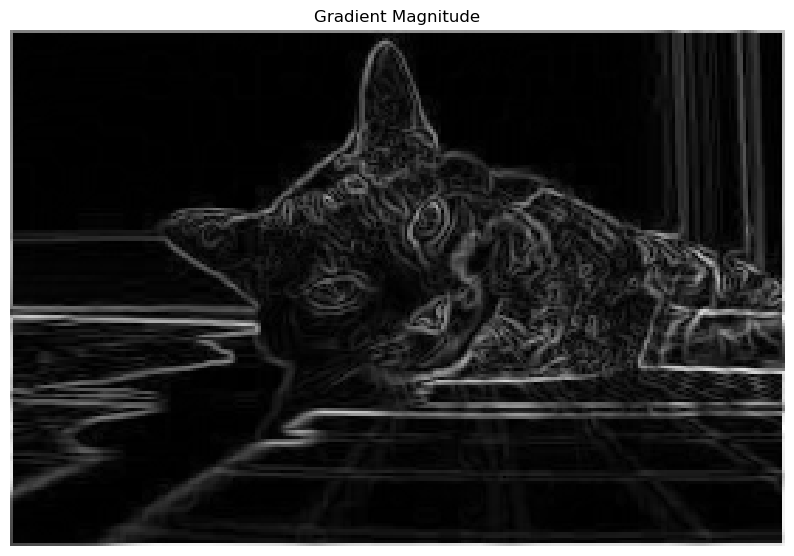

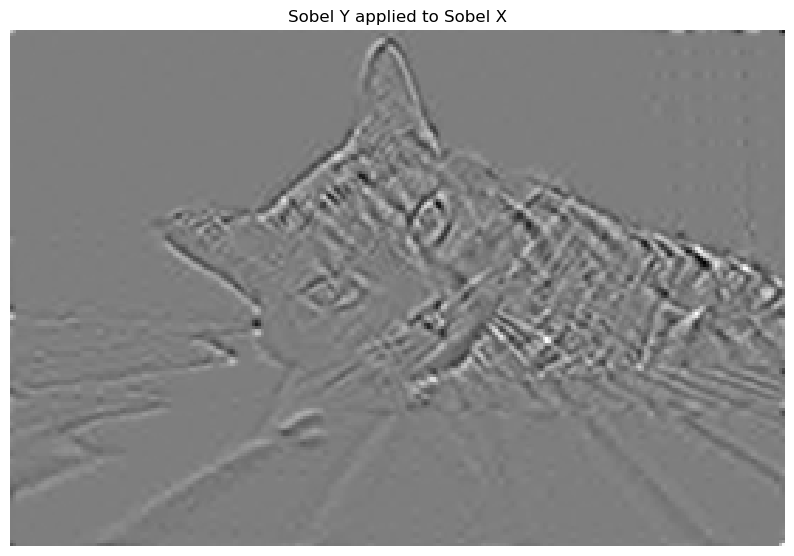

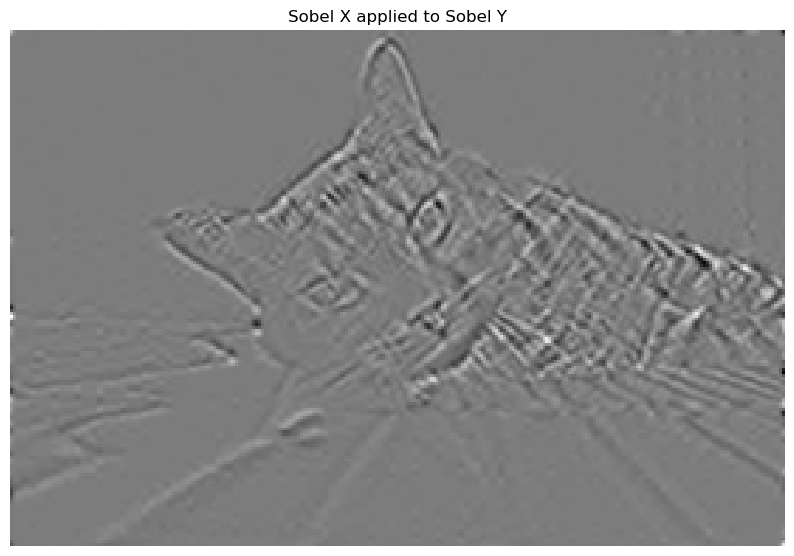


--- Scale: 0.5 ---


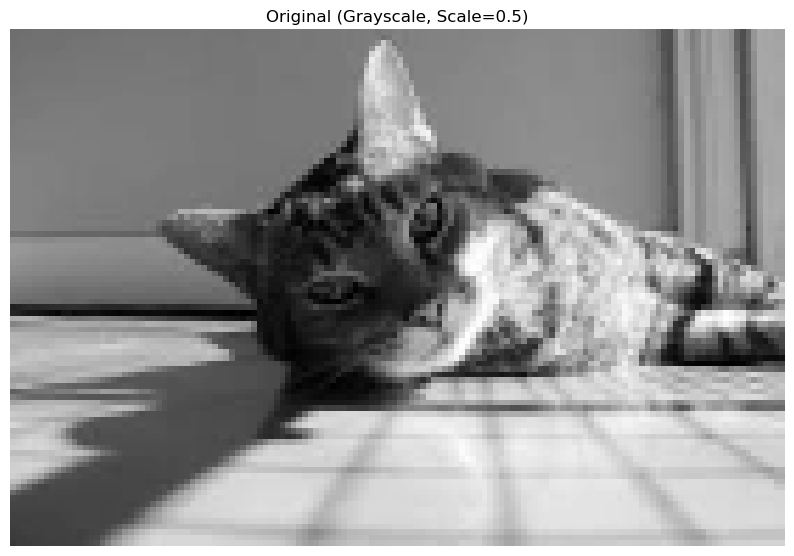

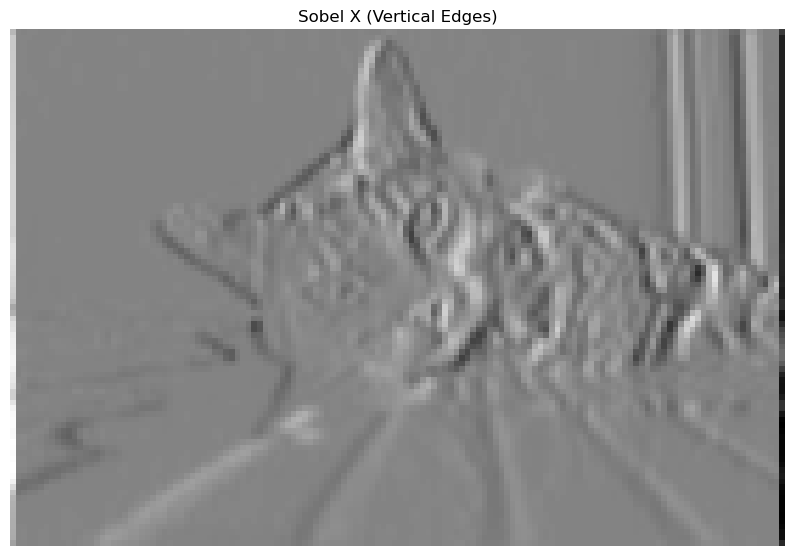

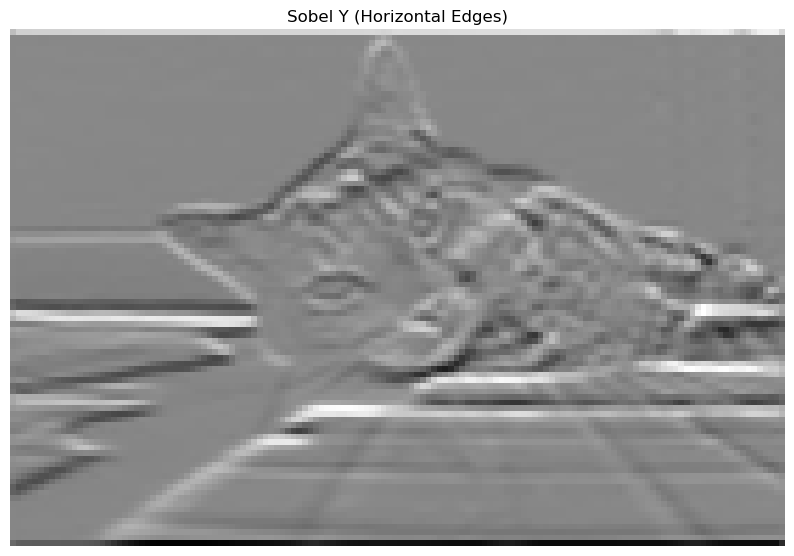

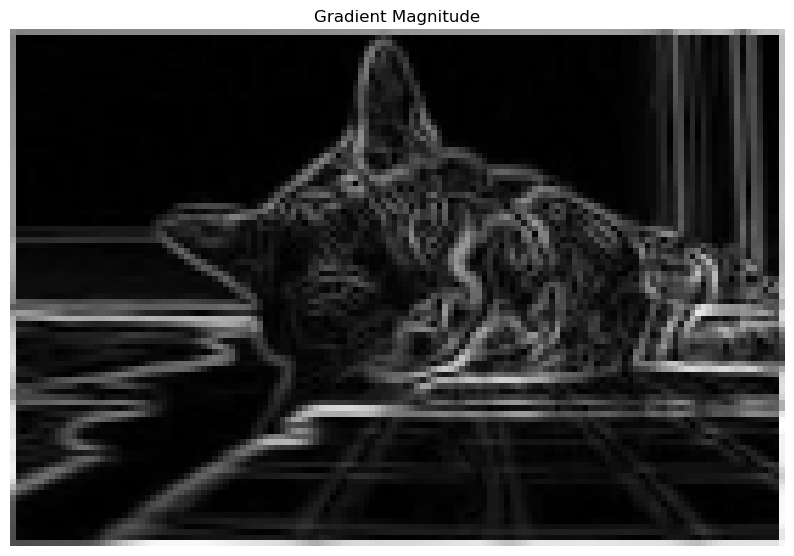

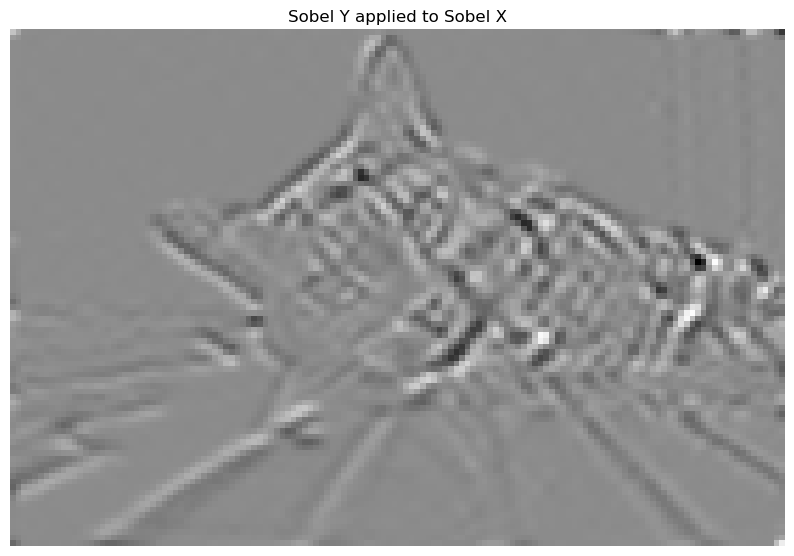

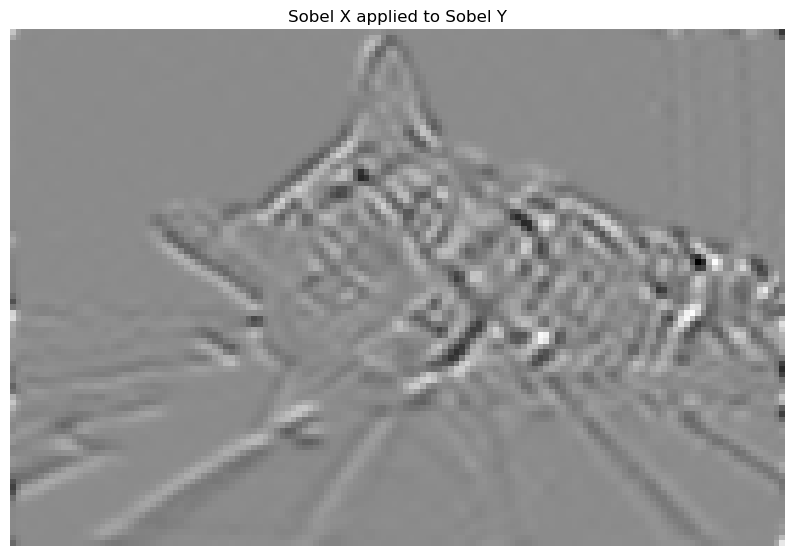

In [20]:
def normalize_edge(edge):
    return (edge- edge.min()) / (edge.max() - edge.min() + 1e-8)

def show_image(img, title):
    plt.imshow(img, cmap='gray')
    plt.title(title)
    plt.axis("off")
    plt.show()

# Load and normalize grayscale version of image (e.g., cat)
image = cv2.imread("images/cat.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
gray = np.mean(image, axis=2)

# Apply Sobel filtering at different scales
for scale in [1.0, 0.5]:
    print(f"\n--- Scale: {scale} ---")
    scaled = cv2.resize(gray, (0, 0), fx=scale, fy=scale)

    # Apply Sobel X and Y
    edge_x = conv(scaled, sobel_x)
    edge_y = conv(scaled, sobel_y)

    # Gradient magnitude
    edge_mag = np.sqrt(edge_x**2 + edge_y**2)

    # Combined Sobel: Y on X and X on Y
    edge_xy = conv(edge_x, sobel_y)
    edge_yx = conv(edge_y, sobel_x)

    # Normalize all for display
    edge_x_disp = normalize_edge(edge_x)
    edge_y_disp = normalize_edge(edge_y)
    edge_mag_disp = normalize_edge(edge_mag)
    edge_xy_disp = normalize_edge(edge_xy)
    edge_yx_disp = normalize_edge(edge_yx)

    # Show results
    show_image(scaled, f"Original (Grayscale, Scale={scale})")
    show_image(edge_x_disp, "Sobel X (Vertical Edges)")
    show_image(edge_y_disp, "Sobel Y (Horizontal Edges)")
    show_image(edge_mag_disp, "Gradient Magnitude")
    show_image(edge_xy_disp, "Sobel Y applied to Sobel X")
    show_image(edge_yx_disp, "Sobel X applied to Sobel Y")


***Your comments/analysis of your results here...***

- sobel filtering is useful for detecting structural details and outlines. 

- sobel X (horizontal kernel) highlights vertical edges such as the outline of the cats body or the edges of the objects in the background

- Sobel Y (vertical kernel) highlights horizontal edges such as the contours along the eyes, mouth or the top of the head

- the gradient magnitude combines both directions and produces a clean edge map showing all prominent features and transitions in intensity. 

- applying sobel Y to the result of Sobel X enhances diagonal and curved edge structures and may even highlight corners more strongly. 

- at smaller image scales ( eg 0.5x), edge details are less sharp or get lost especially fine textures like fur. however large scale edges will appear. 

- normalized edge maps allow you to visualize both positive and negative gradient transitions which are otherwise list if clipped to [0,1]

## Question 4: Image sampling and pyramids (30%)

### 4.1 Image Sampling

- Apply your `resize()` function to reduce an image (I) to 0.5\*height and 0.5\*width

- Repeat the above procedure, but apply a Gaussian blur filter to your original image before downsampling it. How does the result compare to your previous output, and to the original image? Why?


### 4.2 Image Pyramids
- Create a Gaussian pyramid as described in week2's lecture on an image.

- Apply a Gaussian kernel to an image I, and resize it with ratio 0.5, to get $I_1$. Repeat this step to get $I_2$, $I_3$ and $I_4$.

- Display these four images in a manner analogus to the example shown in the lectures.




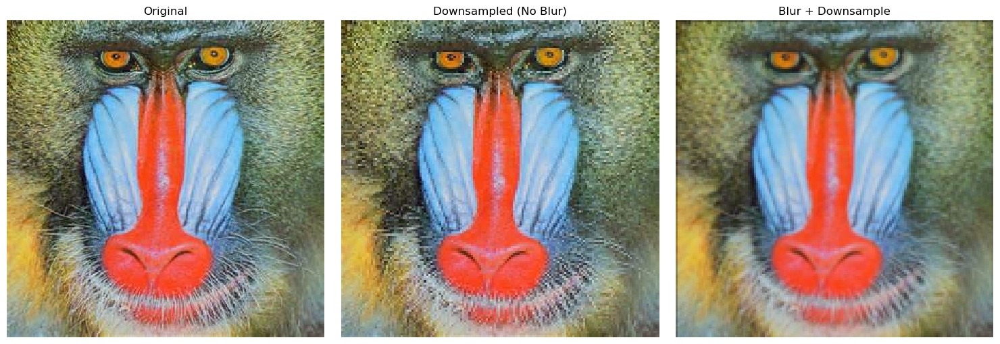

In [21]:


# Load image (use one you've uploaded like "cat.jpg")
image = cv2.imread("images/mandrill.jpg")
if image is None:
    raise FileNotFoundError("Image not found.")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

# Define Gaussian kernel
def gauss2D(size, sigma):
    x, y = np.mgrid[-size//2 + 1:size//2 + 1, -size//2 + 1:size//2 + 1]
    g = np.exp(-((x**2 + y**2)/(2.0*sigma**2)))
    return g / g.sum()

#Downsampling with and without blur
image_half = resize(image, image.shape[0] // 2, image.shape[1] // 2)

kernel = gauss2D(5, 1.0)
blurred = conv(image, kernel)
blurred_half = resize(blurred, blurred.shape[0] // 2, blurred.shape[1] // 2)

# Display comparison
plt.figure(figsize=(15, 5))
titles = ["Original", "Downsampled (No Blur)", "Blur + Downsample"]
images = [image, image_half, blurred_half]

for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis("off")
plt.tight_layout()
plt.show()



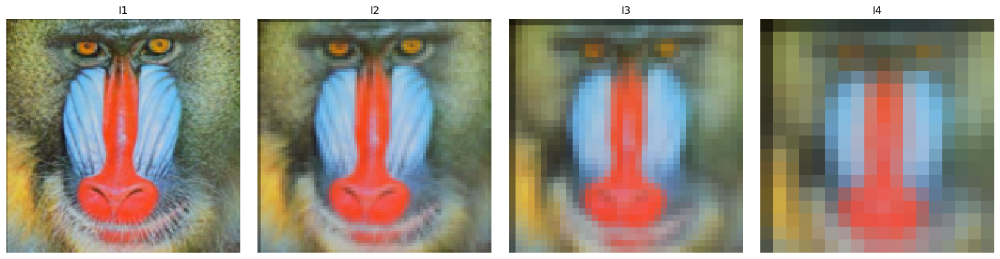

In [22]:
#Gaussian Pyramid (I1 to I4)
pyramid = [image.copy()]
for _ in range(4):
    blurred = conv(pyramid[-1], gauss2D(5, 1.0))
    downsampled = resize(blurred, blurred.shape[0] // 2, blurred.shape[1] // 2)
    pyramid.append(downsampled)

# Display Gaussian pyramid
plt.figure(figsize=(16, 4))
for i in range(1, 5):
    plt.subplot(1, 4, i)
    plt.imshow(pyramid[i])
    plt.title(f"I{i}")
    plt.axis("off")
plt.tight_layout()
plt.show()

***Your comments/analysis of your results here...***

- downsampling without Gaussian blur results in visible aliasing artifacts such as jagged edges, moire patterns or distorted textures. this happens because high frequency details ( like fur, edges and fine patterns) are sampled improperly.

- downsampling with Gaussian blur first produces a smoother and more natural image. the edges are softer, artifacts are significantly reduced because Gaussian filter acts as a low pass filter removing high frequency content before sampling. 

- compared to the original image, both downsampled versions lose detail but the blurred version preserves structure more cleanly. 

## Question 5: (optional, assesed for granting up to 20% bonus marks for the A1)

Image filtering lectures, particularly Lecture 2, have covered the details related to this question. This is a bonus question for the students to get opportunities to recover lost marks in the other parts of the assignment. **Note that the overall marks will be capped at 100%**.

### 5.1 Apply and analyse a blob detector

- Create a Laplacian of Gaussian (LoG) filter in the function `LoG2D()` and visualize its response on your images. You can use the template function (and hints therein) for the task if you wish.

- Modify parameters of the LoG filters and apply them to an image of your choice. Show how these variations are manifested in the output.

- Repeat the experiment by rescaling the image with a combination of appropriate filters designed by you for these assignment. What correlations do you find when changing the scale or modifying the filters?

- How does the response of LoG filter change when you rotate the image by 90 degrees? You can write a function to rotate the image or use an externally rotated image for this task.





In [23]:
# Your code to answer question 5 and display results here
def LoG2D(size, sigma):

    """
       
    Args:
        size: filter height and width
        sigma: std deviation of Gaussian
        
    Returns:
        numpy array of shape (size, size) representing LoG filter
    """

    # use 2D Gaussian filter defination above 
    # it creates a kernel indices from -size//2 to size//2 in each direction, to write a LoG you use the same indices.  
    x, y = np.mgrid[-size//2 + 1:size//2 + 1, -size//2 + 1:size//2 + 1]
    # Please write a correct function below by replacing the Gaussian equation (i.e. the right term of the equation) to implement your LoG filters.
    # your code goes here for Q5
    norm = (x**2 + y**2) / (2 * sigma**2)
    g = ((norm - 1) / (np.pi * sigma**4)) * np.exp(-norm)
    return g/g.sum()



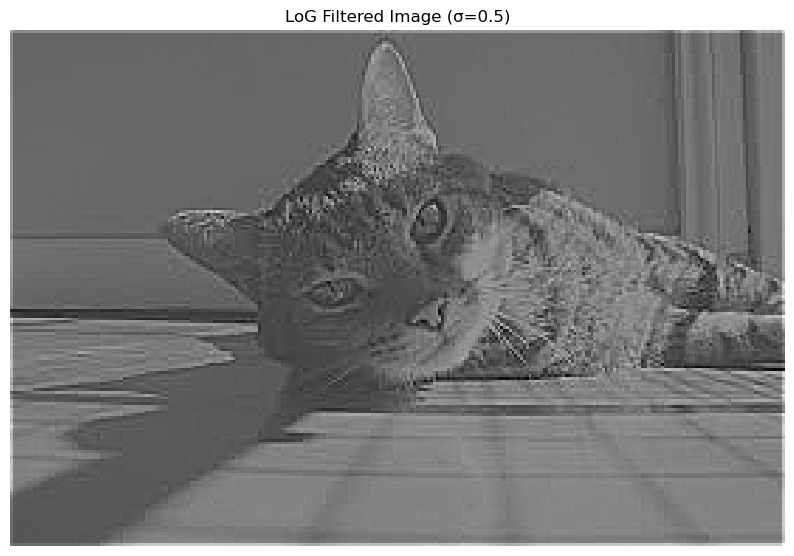

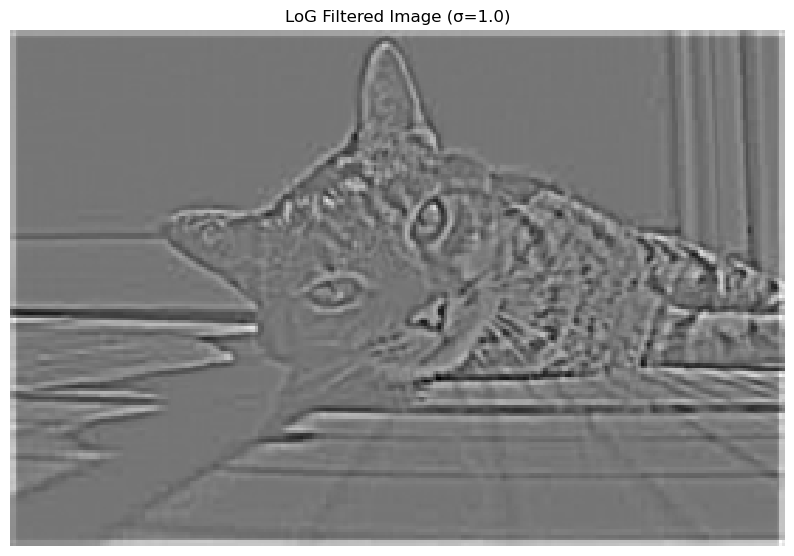

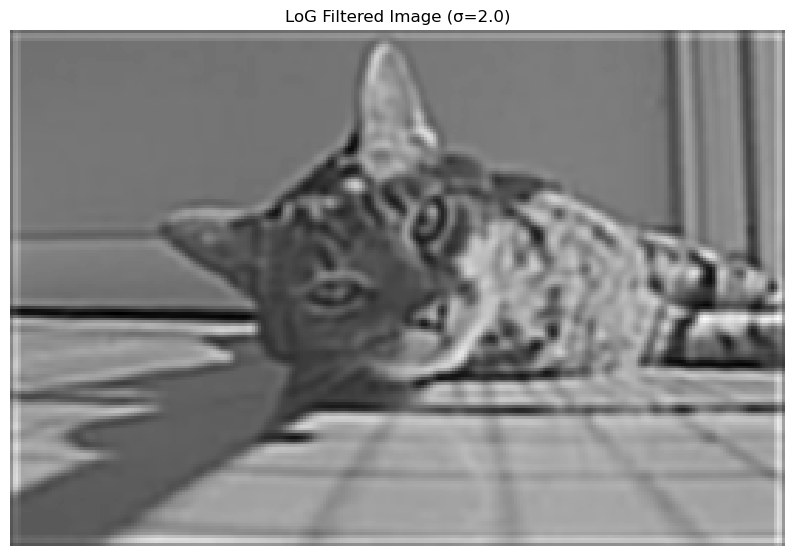

In [24]:
image = cv2.imread("images/cat.jpg")
if image is None:
    raise FileNotFoundError("Image not found.")
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255.0

# Apply LoG with different sigmas
for sigma in [0.5, 1.0, 2.0]:
    kernel =LoG2D(9, sigma)
    filtered = conv(image, kernel)
    plt.imshow(filtered, cmap="gray")
    plt.title(f"LoG Filtered Image (σ={sigma})")
    plt.axis("off")
    plt.show()


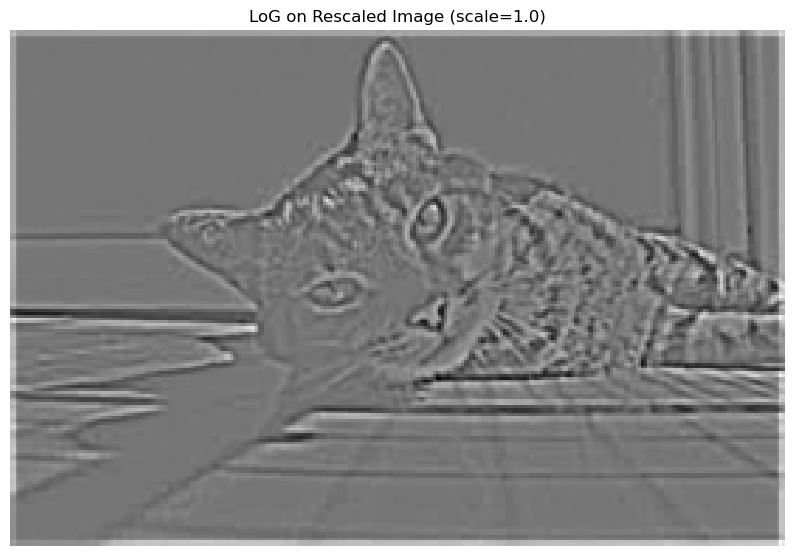

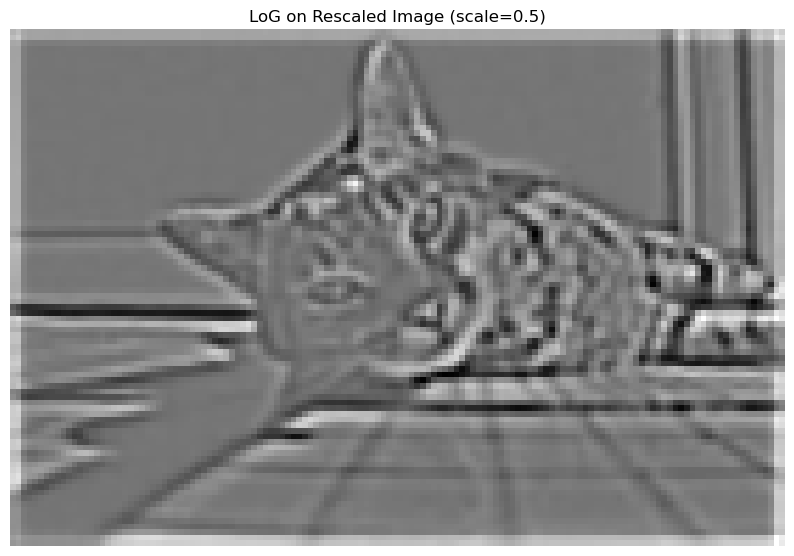

In [25]:
for scale in [1.0, 0.5]:
    resized = cv2.resize(image, (0, 0), fx=scale, fy=scale)
    kernel = LoG2D(9, 1.0)
    filtered = conv(resized, kernel)
    plt.imshow(filtered, cmap="gray")
    plt.title(f"LoG on Rescaled Image (scale={scale})")
    plt.axis("off")
    plt.show()


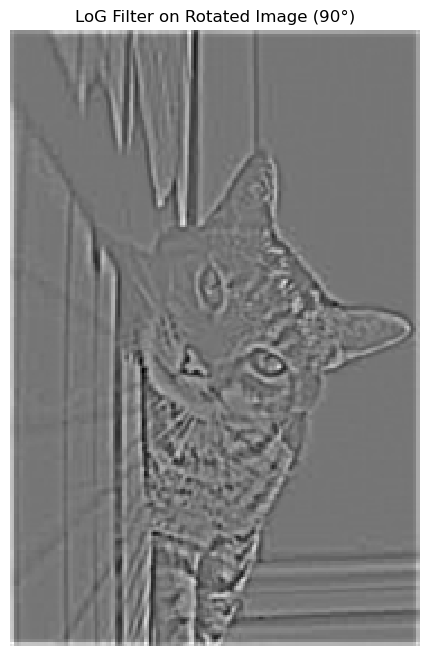

In [26]:
rotated = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
kernel = LoG2D(9, 1.0)
filtered_rotated = conv(rotated, kernel)

plt.imshow(filtered_rotated, cmap="gray")
plt.title("LoG Filter on Rotated Image (90°)")
plt.axis("off")
plt.show()




- The LoG filter highlights **blobs and spots** (regions where intensity changes in multiple directions), rather than just straight edges.
- As **sigma increases**, the filter detects **larger blobs** but loses sensitivity to small details.
- **Rescaling** the image (downsampling) changes the size of detectable blobs — a larger sigma is needed to capture features in smaller images.
- The **response of the LoG filter is rotationally symmetric** — rotating the image by 90° does not significantly change the output, confirming that LoG is **rotation-invariant**.
- This makes LoG filters well-suited for blob detection in images where scale and orientation vary.
